# Coursework 2: Generative Models

## Instructions

Please submit on CATe two zip files:

*CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells below.**
2. Your trained VAE model as *VAE_model.pth*

*GAN.zip* containing your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

Please avoid using markdown headings (# ## etc.) as these will affect the ToC. Instead use html headings if you want emphasis.

Similarly to the previous coursework, we recommend that you use Google Colaboratory in order to train the required networks.

TAs will run a testing cell (at the end of this notebook), so you are required to copy your transform and denorm functions to a cell near the bottom of the document (it is demarkated).

<font color="blue">**The deadline for submission is 19:00, Thursday 19th February, 2021** </font>

## Setting up working environment

For this coursework you, will need to train a large network, therefore we recommend you work with Google Colaboratory, which provides free GPU time. You will need a Google account to do so.

Please log in to your account and go to the following page: https://colab.research.google.com. Then upload this notebook.

For GPU support, go to "Edit" -> "Notebook Settings", and select "Hardware accelerator" as "GPU".

You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.


In [2]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. Experiment with Feedforward and Convolutional Layers to see which gives better results.

b. Design an appropriate loss function and train the model.


In [17]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
###Hyper-parameter selection


In [18]:
# Necessary Hyperparameters 
num_epochs = 25
learning_rate = 0.001
batch_size = 128
latent_dim = 16 # Choose a value for the size of the latent space

# Additional Hyperparameters 
conv1_c = 32
conv2_c = 64
leaky_relu = 0.2
beta = 2.5

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [19]:
train_dat = datasets.MNIST(
    "data/", train=True, download=True, transform=transform
)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [23]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.conv1 = nn.Sequential( nn.Conv2d(1, conv1_c, kernel_size = 4, stride = 2, padding = 1),
                                    nn.BatchNorm2d(conv1_c),
                                    nn.LeakyReLU(leaky_relu,inplace=True))

        self.conv2 = nn.Sequential( nn.Conv2d(conv1_c, conv2_c, kernel_size = 4, stride = 2, padding = 1),
                                    nn.BatchNorm2d(conv2_c),
                                    nn.LeakyReLU(leaky_relu,inplace=True))

        self.conv3 = nn.Sequential( nn.Conv2d(conv2_c, conv1_c, kernel_size = 3, stride = 1, padding = 1),
                                    nn.BatchNorm2d(conv1_c),
                                    nn.LeakyReLU(leaky_relu,inplace=True))

        self.fcl1 = nn.Sequential(nn.Linear(conv1_c * 7 * 7, 128),
                           nn.LeakyReLU(leaky_relu,inplace=True)) 

        self.fc12_1 = nn.Linear(128, latent_dim)
        self.fc12_2 = nn.Linear(128, latent_dim)


        self.fcld1 = nn.Sequential(nn.Linear(latent_dim, 128)) 
        self.fcld2 = nn.Sequential(nn.Linear(128, conv1_c * 7 * 7),
                            nn.ReLU())     

        # self.dropoutd = nn.Dropout(p = dropout)

        # self.deconv1 = nn.Sequential(nn.ConvTranspose2d(conv1_c, conv2_c, kernel_size=3, stride=1, padding = 1),
        #                              nn.BatchNorm2d(conv2_c),
        #                              nn.ReLU())
        self.deconv2 = nn.Sequential(nn.ConvTranspose2d(conv1_c, conv1_c, kernel_size=4, stride=2, padding = 1),
                                     nn.BatchNorm2d(conv1_c),
                                     nn.ReLU())

        self.deconv3 = nn.Sequential(nn.ConvTranspose2d(conv1_c, 1, kernel_size=4, stride=2, padding = 1),
                                     nn.Sigmoid())
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)
        out = self.fcl1(out.view(out.size(0),-1))
        return self.fc12_1(out),self.fc12_2(out)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        std = torch.exp(logvar / 2)
        epsilon = torch.randn_like(std)

        return mu + epsilon * std
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.fcld1(z)
        out = self.fcld2(out)
        # print(out.shape)
        out = out.view(z.size(0), conv1_c, 7, 7)
        # out = self.deconv1(out)
        out = self.deconv2(out)
        out = self.deconv3(out)
        # out = self.deconv3(out)
        return out
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        out = self.reparametrize(mu, logvar)
        out = self.decode(out)
        return out, mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 478497
VAE(
  (conv1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (fcl1): Sequential(
    (0): Linear(in_features=1568, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (fc12_1): Linear(in_features=128, out_features=16, bias=True)
  (fc12_2): Linear(i

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        bce = F.binary_cross_entropy(recon_x, x, reduction='sum') / batch_size
        kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / batch_size

        return bce, kld * beta
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model.train()
#######################################################################
#                       ** START OF YOUR CODE **
#######################################################################
total_loss_train = []
kl_loss_train = []
recon_loss_train = []

total_loss_test = []
kl_loss_test = []
recon_loss_test = []
#######################################################################
#                       ** END OF YOUR CODE **
####################################################################### 

for epoch in range(num_epochs):     
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        model.train()
        total_loss_train_epoch = 0
        kl_loss_train_epoch = 0
        recon_loss_train_epoch = 0

        for batch_idx, (data, _) in enumerate(loader_train):
          data = data.to(device)
          model.zero_grad()


          recon_x, mu, logvar = model(data)
          recon_loss, kl_loss = loss_function_VAE(recon_x, data, mu, logvar, beta)
          total_loss = recon_loss + kl_loss
          total_loss_train_epoch += total_loss.item()
          kl_loss_train_epoch += kl_loss.item() / beta
          recon_loss_train_epoch += recon_loss.item()


          total_loss.backward()
          optimizer.step()

        total_loss_train.append(total_loss_train_epoch / len(loader_train.dataset))
        kl_loss_train.append(kl_loss_train_epoch / len(loader_train.dataset))
        recon_loss_train.append(recon_loss_train_epoch / len(loader_train.dataset))

        print('epoch [{}/{}], train loss:{:.4f}'.format(epoch + 1, num_epochs, total_loss_train_epoch / len(loader_train.dataset)))
        
        model.eval()
        total_loss_test_epoch = 0
        kl_loss_test_epoch = 0
        recon_loss_test_epoch = 0

        with torch.no_grad():
          for batch_idx, (data, _) in enumerate(loader_test):
            data = data.to(device)
            recon_x, mu, logvar = model(data)
            recon_loss, kl_loss = loss_function_VAE(recon_x, data, mu, logvar, beta)
            total_loss = recon_loss + kl_loss
            total_loss_test_epoch += total_loss.item()
            kl_loss_test_epoch += kl_loss.item() / beta
            recon_loss_test_epoch += recon_loss.item()
        
        total_loss_test.append(total_loss_test_epoch / len(loader_test.dataset))
        kl_loss_test.append(kl_loss_test_epoch / len(loader_test.dataset))
        recon_loss_test.append(recon_loss_test_epoch / len(loader_test.dataset))

        print('epoch [{}/{}], test loss:{:.4f}'.format(epoch + 1, num_epochs, total_loss_test_epoch / len(loader_test.dataset)))

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')


epoch [1/25], train loss:1.3808
epoch [1/25], test loss:1.0844
epoch [2/25], train loss:1.0679
epoch [2/25], test loss:1.0416
epoch [3/25], train loss:1.0409
epoch [3/25], test loss:1.0301
epoch [4/25], train loss:1.0276
epoch [4/25], test loss:1.0139
epoch [5/25], train loss:1.0168
epoch [5/25], test loss:1.0078
epoch [6/25], train loss:1.0119
epoch [6/25], test loss:1.0026
epoch [7/25], train loss:1.0069
epoch [7/25], test loss:1.0009
epoch [8/25], train loss:1.0021
epoch [8/25], test loss:0.9941
epoch [9/25], train loss:0.9988
epoch [9/25], test loss:0.9944
epoch [10/25], train loss:0.9959
epoch [10/25], test loss:0.9893
epoch [11/25], train loss:0.9930
epoch [11/25], test loss:0.9868
epoch [12/25], train loss:0.9911
epoch [12/25], test loss:0.9838
epoch [13/25], train loss:0.9884
epoch [13/25], test loss:0.9837
epoch [14/25], train loss:0.9867
epoch [14/25], test loss:0.9795
epoch [15/25], train loss:0.9853
epoch [15/25], test loss:0.9780
epoch [16/25], train loss:0.9832
epoch [16/

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [ ]:
# Any code for your explanation here

**YOUR ANSWER**

The VAE loss function have two terms: one is aimed to maximises the reconstruction likelihood, and the other is designed to make the approximation of the posterior $q_\phi(z \mid X) $ becomes closer to the prior distribution $ p_θ(z) $.

1. As for $D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$, we assume that:

* $ p_θ(z) \sim N\left(0, I\right)$, so $ p_θ(z) $ has no parameter, so it can be writen as $ p(z) $.
* $q_\phi(z \mid X)  \sim N\left(\mu, \Sigma ; x^{(i)}\right)$

Then, we can get:

$$\begin{aligned} & D_{K L}\left(q_{\phi}\left(z \mid x^{(i)}\right)_{d} \| p_{\theta}(z)_{d}\right) \\=& K L\left(N\left(\mu_{d}, \sigma_{d}^{2}\right) \| N(0,1)\right) \\=& \frac{1}{2}\left(-\log \sigma_{d}^{2}+\mu_{d}^{2}+\sigma_{d}^{2}-1\right) \end{aligned}$$

So, the python code is `kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())`

2. As for $\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]$, we know $\mathbb{E}_{z}\left[\log p_{\theta}\left(x^{(i)} \mid z\right)\right] \approx \log p_{\theta}\left(x^{(i)} \mid z\right)$, and we assume $p_{\theta}(x \mid z) \sim$ Bernoulli distribution, which corresponds to a binary value $X$ and  a vector  with  $Q$ independent dimensions $\left[\rho_{1}, \rho_{2}, \ldots, \rho_{Q}\right]$. Then we can get $\rho(z)=\operatorname{dec}_{\theta}(z)$. Now, we can calculate the reconstruction likelihood $\log p_{\theta}\left(x^{(i)} \mid z\right)=\sum_{q=1}^{Q}\left(x_{q}^{(i)} \log \left[\rho_{q}(z)\right]+\left(1-x_{q}^{(i)}\right) \log \left[1-\rho_{q}(z)\right]\right)$.

So, we designed the sigmoid as activation function for the last layer, and use binary cross entropy as loss function. `bce = F.binary_cross_entropy(recon_x, x, reduction='sum') / batch_size`

3. As for $\beta$, it will reduce information of $z$, however improve the ability of disentanglement.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

In [ ]:
# *CODE FOR PART 1.2a IN THIS CELL*

# before running this code, we should make sure beta == 2.5
if beta == 2.5:
  total_loss_train_beta25 = total_loss_train
  total_loss_test_beta25 = total_loss_test
  recon_loss_train_beta25 = recon_loss_train
  recon_loss_test_beta25 = recon_loss_test
  kl_loss_train_beta25 = kl_loss_train
  kl_loss_test_beta25 = kl_loss_test

In [ ]:
if beta == 1:
  total_loss_train_beta1 = total_loss_train
  total_loss_test_beta1 = total_loss_test
  recon_loss_train_beta1 = recon_loss_train
  recon_loss_test_beta1 = recon_loss_test
  kl_loss_train_beta1 = kl_loss_train
  kl_loss_test_beta1 = kl_loss_test

In [ ]:
if beta == 4:
  total_loss_train_beta4 = total_loss_train
  total_loss_test_beta4 = total_loss_test
  recon_loss_train_beta4 = recon_loss_train
  recon_loss_test_beta4 = recon_loss_test
  kl_loss_train_beta4 = kl_loss_train
  kl_loss_test_beta4 = kl_loss_test

Text(0.5, 1.0, 'KL Divergence Loss')

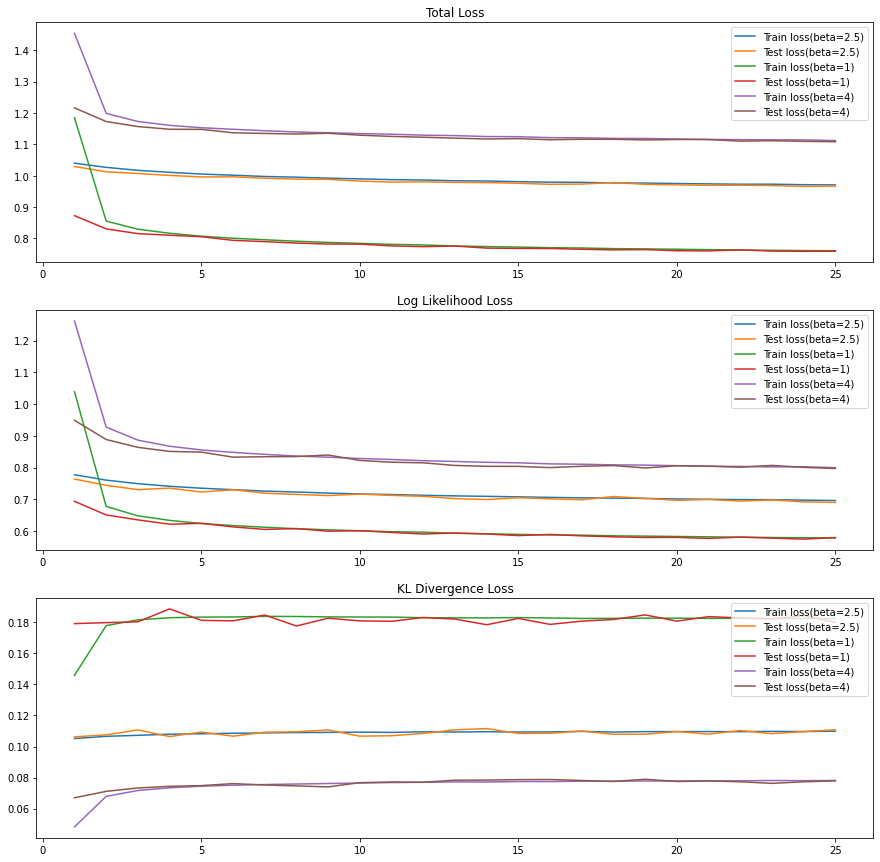

In [ ]:


fig, axs = plt.subplots(3, 1, figsize=(15,15))
axs[0].plot(list(range(1, 1 + len(total_loss_train_beta25))), total_loss_train_beta25)
axs[0].plot(list(range(1, 1 + len(total_loss_test_beta25))), total_loss_test_beta25)
axs[0].plot(list(range(1, 1 + len(total_loss_train_beta1))), total_loss_train_beta1)
axs[0].plot(list(range(1, 1 + len(total_loss_test_beta1))), total_loss_test_beta1)
axs[0].plot(list(range(1, 1 + len(total_loss_train_beta4))), total_loss_train_beta4)
axs[0].plot(list(range(1, 1 + len(total_loss_test_beta4))), total_loss_test_beta4)
axs[0].legend(['Train loss(beta=2.5)', 'Test loss(beta=2.5)','Train loss(beta=1)', 'Test loss(beta=1)','Train loss(beta=4)', 'Test loss(beta=4)'])
axs[0].set_title('Total Loss')

axs[1].plot(list(range(1, 1 + len(recon_loss_train_beta25))), recon_loss_train_beta25)
axs[1].plot(list(range(1, 1 + len(recon_loss_test_beta25))), recon_loss_test_beta25)
axs[1].plot(list(range(1, 1 + len(recon_loss_train_beta1))), recon_loss_train_beta1)
axs[1].plot(list(range(1, 1 + len(recon_loss_test_beta1))), recon_loss_test_beta1)
axs[1].plot(list(range(1, 1 + len(recon_loss_train_beta4))), recon_loss_train_beta4)
axs[1].plot(list(range(1, 1 + len(recon_loss_test_beta4))), recon_loss_test_beta4)
axs[1].legend(['Train loss(beta=2.5)', 'Test loss(beta=2.5)','Train loss(beta=1)', 'Test loss(beta=1)','Train loss(beta=4)', 'Test loss(beta=4)'])
axs[1].set_title('Log Likelihood Loss')

axs[2].plot(list(range(1, 1 + len(kl_loss_train_beta25))), kl_loss_train_beta25)
axs[2].plot(list(range(1, 1 + len(kl_loss_test_beta25))), kl_loss_test_beta25)
axs[2].plot(list(range(1, 1 + len(kl_loss_train_beta1))), kl_loss_train_beta1)
axs[2].plot(list(range(1, 1 + len(kl_loss_test_beta1))), kl_loss_test_beta1)
axs[2].plot(list(range(1, 1 + len(kl_loss_train_beta4))), kl_loss_train_beta4)
axs[2].plot(list(range(1, 1 + len(kl_loss_test_beta4))), kl_loss_test_beta4)
axs[2].legend(['Train loss(beta=2.5)', 'Test loss(beta=2.5)','Train loss(beta=1)', 'Test loss(beta=1)','Train loss(beta=4)', 'Test loss(beta=4)'])
axs[2].set_title('KL Divergence Loss')

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


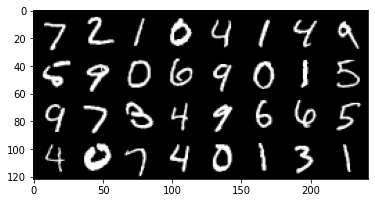

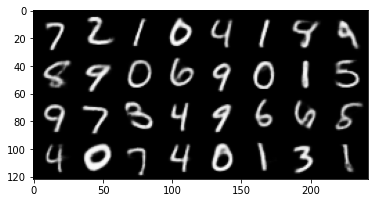

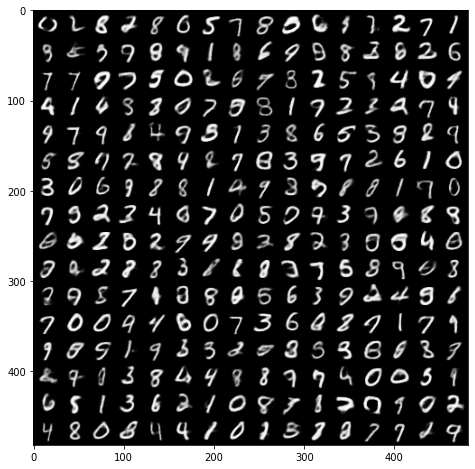

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    fixed_input = fixed_input.to(device)
    recon_batch, _, _ = model(fixed_input)
    recon_batch = recon_batch.view(-1, 1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z).view(-1, 1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? Have you observed posterior collapse during traing (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

During training, the log-likelihood loss decreases with increasing epochs and then stabilises, and if we increase the beta, it will converge to a higher value. This behaviour is desirable, for we can get a better network to sample outputs which can be similar to the training data.

While KL loss first increases with more epochs and then stabilises, and if we use a higher beta, it will converge to a lower value. Because we performed gradient descent the sign of KL loss in the loss function is flipped, so an increase is desirable.

To combat posterior collapse, which was observed during initial training, first we increased the epochs, and also decrease the dimension of z, while if it is not enough, we can get little factors.

As for beta, the higher beta, the generated image can be more desirable, however, the T-SNE result can be quite terrible. So we need to find a balance between them.


---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [26]:
# *CODE FOR PART 1.3a IN THIS CELL

from sklearn.manifold import TSNE
import numpy as np

z_batches = []
label_batches = []
for i, (data, label) in enumerate(loader_test):
  data = data.to(device)
  mu, logvar = model.encode(data)
  z = model.reparametrize(mu, logvar).detach().cpu().numpy()
  z_batches.append(z)
  label_batches.append(label.detach().cpu().numpy())

zs = []
labels = []
for z, label in zip(z_batches, label_batches):
  for i in z:
    zs.append(i)
  for l in label:
    labels.append(l)

z_embedded = TSNE(n_components=2).fit_transform(np.array(zs))

In [ ]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

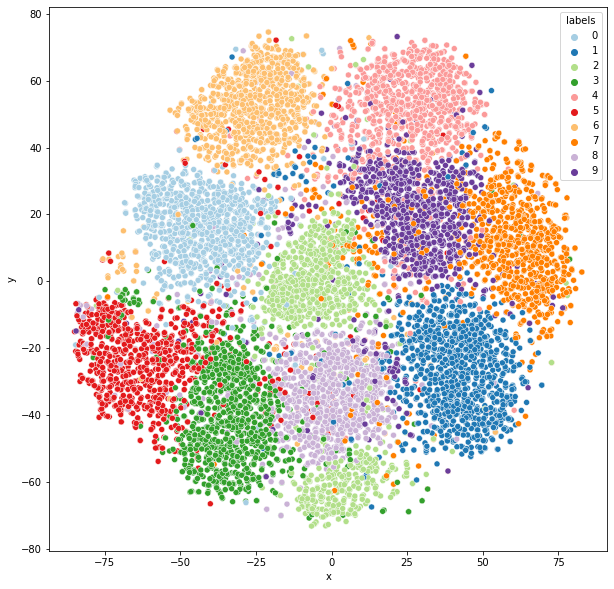

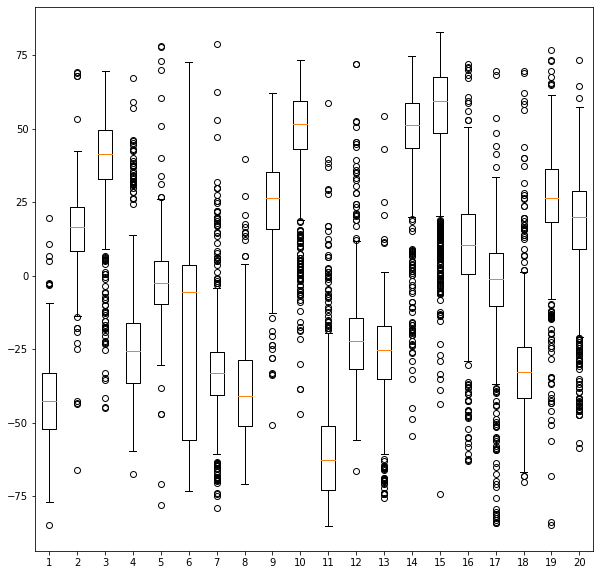

In [46]:
# Custom Visualizations
import seaborn as sns
import pandas as pd

data_dict = {'x': z_embedded[:, 0], 'y': z_embedded[:, 1], 'labels': labels}
df = pd.DataFrame(data_dict)

plt.figure(figsize = (10,10))
sns.scatterplot(x='x', y='y', data=df, hue='labels', legend='full', palette='Paired')
plt.show()

zero_x=np.array(df.x[df["labels"]==0])
zero_y=np.array(df.y[df["labels"]==0])
one_x=np.array(df.x[df["labels"]==1])
one_y=np.array(df.y[df["labels"]==1])
two_x=np.array(df.x[df["labels"]==2])
two_y=np.array(df.y[df["labels"]==2])
three_x=np.array(df.x[df["labels"]==3])
three_y=np.array(df.y[df["labels"]==3])
four_x=np.array(df.x[df["labels"]==4])
four_y=np.array(df.y[df["labels"]==4])
five_x=np.array(df.x[df["labels"]==5])
five_y=np.array(df.y[df["labels"]==5])
six_x=np.array(df.x[df["labels"]==6])
six_y=np.array(df.y[df["labels"]==6])
siven_x=np.array(df.x[df["labels"]==7])
siven_y=np.array(df.y[df["labels"]==7])
eight_x=np.array(df.x[df["labels"]==8])
eight_y=np.array(df.y[df["labels"]==8])
night_x=np.array(df.x[df["labels"]==9])
night_y=np.array(df.y[df["labels"]==9])

data=[zero_x,zero_y,one_x,one_y,two_x,two_y,three_x,three_y,four_x,four_y,five_x,five_y,six_x,six_y,siven_x,siven_y,eight_x,eight_y,night_x,night_y]
plt.figure(figsize = (10,10))
plt.boxplot(data)
plt.show()

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

**YOUR ANSWER**

Actually, when seeing the boxplot, some labels have quite huge outliers in either x or y, but not in both, so it looks quite good in scatterplot. We can observe that points in the 2D embedding are similar to their neighbours, so the clusters and boundaries are obviously.

We also observe relatively smooth boundaries of points, which is the effect of the reconstruction loss and the KL loss. The KL loss make the network to learn more or less latent distributions, and the trade off can be infulenced by $\beta$.

The label 2 is really spetial for having two clusters, and it may be due to two different styles of writing.

T-SNE is reliable, for it succeeded in reducing dimensions in the latent sapce, whilst it managed to distinguish one digit from an other in the 2-d space. The perplexity is a very important parameter, if it is too small we can get too many clusters, while if it is too big, we will find all the points are in the same cluster.

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


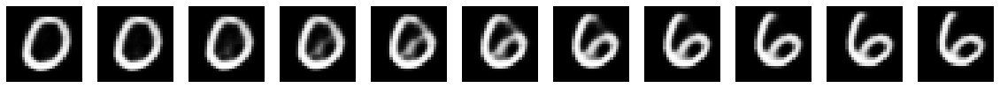

In [59]:
# CODE FOR PART 1.3b IN THIS CELL

vae = torch.jit.load('./model/VAE_model.pth')
model.load_state_dict(vae.state_dict())
# model.eval()
test_data, test_labels = next(iter(loader_test))

x1 = torch.FloatTensor(test_data[100]).reshape(1,1,28,28)
x2 = torch.FloatTensor(test_data[10]).reshape(1,1,28,28)

with torch.no_grad():
    x1 = x1.to(device)
    x2 = x2.to(device)
    mu1, var1 = model.encode(x1)
    mu2, var2 = model.encode(x2)
    z1 = model.reparametrize(mu1, var1)
    z2 = model.reparametrize(mu2, var2)
    a = np.linspace(0,1,num=11)
    inter = []
    for i in range(len(a)):
        Z = a[i] * z1 + (1 - a[i]) * z2 
        x_hat = model.decode(Z)
        inter.append(x_hat)

fig, axs = plt.subplots(1, 11, figsize=(20, 20))
for i in range(11):
    y = inter[i].view(28,28).squeeze().squeeze().cpu().numpy()
    axs[i].imshow(y, cmap='gray')
    axs[i].axis('off')

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

From the above picture, we can see the change from 0 to 6. On the most left picture, we can see a clear 0, and on the right we can see a clear 6, while in the middle it looks like both 0 and 6.

I guess, maybe the interpolation is just like one point have a linear movement from one cluster to another.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures, tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [38]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/GAN2'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/GAN2')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small receptive fields, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [15]:
batch_size = 128  # change that

transform = transforms.Compose([
      transforms.Resize(64),
      transforms.RandomHorizontalFlip(p=0.5),                                
      transforms.ToTensor(),
      transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

transform_test = transforms.Compose([
      transforms.Resize(64),                            
      transforms.ToTensor(),
      transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform_test)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

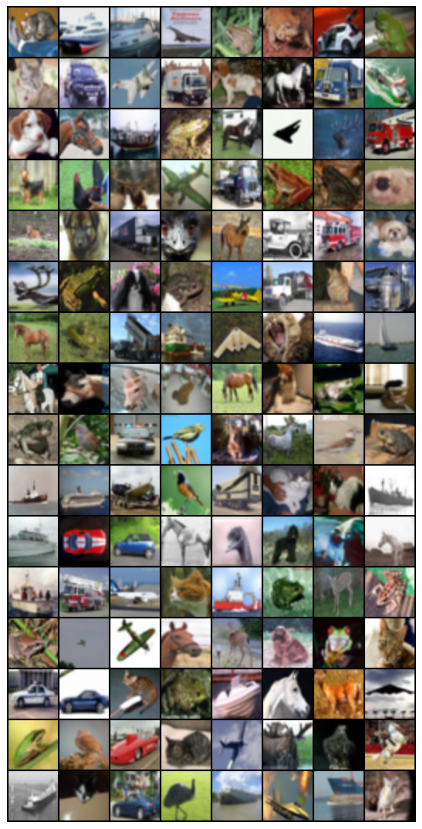

In [16]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [44]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 100
learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams
num_gen_features = 64
num_disc_features = 64

In [45]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        #input 100*1*1
        self.layer1 = nn.Sequential(nn.ConvTranspose2d(latent_vector_size,num_gen_features*8,4,1,0,bias = False),
                       nn.BatchNorm2d(num_gen_features*8),
                       nn.ReLU(True))

        #input 512*4*4
        self.layer2 = nn.Sequential(nn.ConvTranspose2d(num_gen_features*8,num_gen_features*4,4,2,1,bias = False),
                       nn.BatchNorm2d(num_gen_features*4),
                       nn.ReLU(True))
        #input 256*8*8
        self.layer3 = nn.Sequential(nn.ConvTranspose2d(num_gen_features*4,num_gen_features*2,4,2,1,bias = False),
                       nn.BatchNorm2d(num_gen_features*2),
                       nn.ReLU(True))
        #input 128*16*16
        self.layer4 = nn.Sequential(nn.ConvTranspose2d(num_gen_features*2,num_gen_features,4,2,1,bias = False),
                       nn.BatchNorm2d(64),
                       nn.ReLU(True))
        #input 64*32*32
        self.layer5 = nn.Sequential(nn.ConvTranspose2d(num_gen_features,3,4,2,1,bias = False),
                       nn.Tanh())
        #output 3*64*64
      
        self.embedding = nn.Embedding(10, latent_vector_size)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, z, label):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        label_embedding = self.embedding(label)
        z = z.view(-1, latent_vector_size)
        out = torch.mul(z, label_embedding)
        out = out.view(-1, latent_vector_size, 1, 1)
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        #input 3*64*64
        self.layer1 = nn.Sequential(nn.Conv2d(3,num_disc_features,4,2,1,bias = False),
                       nn.BatchNorm2d(num_disc_features),
                       nn.LeakyReLU(0.2,True),
                       nn.Dropout2d(0.5))
        
        #input 64*32*32
        self.layer2 = nn.Sequential(nn.Conv2d(num_disc_features,num_disc_features*2,4,2,1,bias = False),
                       nn.BatchNorm2d(num_disc_features*2),
                       nn.LeakyReLU(0.2,True),
                       nn.Dropout2d(0.5))
        #input 128*16*16
        self.layer3 = nn.Sequential(nn.Conv2d(num_disc_features*2,num_disc_features*4,4,2,1,bias = False),
                       nn.BatchNorm2d(num_disc_features*4),
                       nn.LeakyReLU(0.2,True),
                       nn.Dropout2d(0.5))
        #input 256*8*8
        self.layer4 = nn.Sequential(nn.Conv2d(num_disc_features*4,num_disc_features*8,4,2,1,bias = False),
                       nn.BatchNorm2d(num_disc_features*8),
                       nn.LeakyReLU(0.2,True))
        #input 512*4*4
        self.out_layer = nn.Sequential(nn.Conv2d(num_disc_features*8,1,4,1,0,bias = False),
                         nn.Sigmoid())
        
        self.label_layer = nn.Sequential(nn.Conv2d(num_disc_features*8,11,4,1,0,bias = False),
                          nn.LogSoftmax(dim = 1))
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        out = self.out_layer(x)
        label = self.label_layer(x)
        
        out = out.view(-1)
        label = label.view(-1,11)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out, label


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [46]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [47]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3577704
Generator(
  (layer1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (layer2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (layer3): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (layer4): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Re

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [48]:
criterion = nn.BCELoss()
def loss_function(out, label):
    loss = criterion(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [49]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))
schedD   = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[50], gamma= 0.1)
schedG   = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[50, 75], gamma= 0.1)

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [50]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
fixed_labels = torch.randint(0,10,(batch_size,),dtype = torch.long,device = device)
print(fixed_noise.size())
print(batch_size)
real_labels = 0.7 + 0.5 * torch.rand(10, device = device)
fake_labels = 0.3 * torch.rand(10, device = device)

torch.Size([80, 100, 1, 1])
80


#### Training Loop

In [51]:
train_losses_G = []
train_losses_D = []

for epoch in range(num_epochs):
    train_loss_D = 0
    train_loss_G = 0
    for i, data in enumerate(loader_train, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################device
        # train with real

        model_D.zero_grad()
        real_cpu = data[0].to(device)
        labels = data[1].to(device)
        real_label = real_labels[i % 10]
        fake_label = fake_labels[i % 10]
        batch_size = real_cpu.size(0)
        fake_class_labels = 10 * torch.ones((batch_size,), dtype = torch.long, device = device)

        if i % 30 == 0:
            real_label, fake_label = fake_label, real_label
        label = torch.full((batch_size,), real_label, device=device)


        output, out_labels = model_D(real_cpu)
        errD_real = loss_function(output, label) + F.nll_loss(out_labels, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
        sample_labels = torch.randint(0,10,(batch_size,), dtype = torch.long, device = device)

        fake = model_G(noise, sample_labels)

        label.fill_(fake_label)

        output, out_labels = model_D(fake.detach())
        errD_fake = loss_function(output, label) + F.nll_loss(out_labels, fake_class_labels)
        errD_fake.backward()

        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        train_loss_D += errD.item()
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()
        label.fill_(1)
        output, outlabels = model_D(fake)

        errG = loss_function(output, label) + F.nll_loss(outlabels, sample_labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        train_loss_G += errG.item()
        optimizerG.step()

        print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
            % (epoch+1, num_epochs, i+1, len(loader_train),
                errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    schedD.step()
    schedG.step()
    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/GAN2/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise, fixed_labels)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/GAN2/fake_samples_epoch_%03d.png' % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))

流式输出内容被截断，只能显示最后 5000 行内容。
[88/100][84/391] Loss_D: 3.5527 Loss_G: 3.0607 D(x): 0.5631 D(G(z)): 0.5151 / 0.3833
[88/100][85/391] Loss_D: 2.7218 Loss_G: 2.4398 D(x): 0.7468 D(G(z)): 0.4465 / 0.4565
[88/100][86/391] Loss_D: 3.3780 Loss_G: 2.6007 D(x): 0.6515 D(G(z)): 0.5268 / 0.4394
[88/100][87/391] Loss_D: 3.3666 Loss_G: 3.6614 D(x): 0.6080 D(G(z)): 0.4639 / 0.3211
[88/100][88/391] Loss_D: 3.1745 Loss_G: 3.7921 D(x): 0.5723 D(G(z)): 0.4475 / 0.3165
[88/100][89/391] Loss_D: 2.7192 Loss_G: 2.3323 D(x): 0.6846 D(G(z)): 0.4141 / 0.4812
[88/100][90/391] Loss_D: 3.1284 Loss_G: 1.8367 D(x): 0.6773 D(G(z)): 0.5080 / 0.5611
[88/100][91/391] Loss_D: 3.4666 Loss_G: 2.4045 D(x): 0.6386 D(G(z)): 0.4810 / 0.5057
[88/100][92/391] Loss_D: 2.6873 Loss_G: 2.5932 D(x): 0.7031 D(G(z)): 0.4250 / 0.4516
[88/100][93/391] Loss_D: 3.2966 Loss_G: 3.1624 D(x): 0.6746 D(G(z)): 0.5215 / 0.3739
[88/100][94/391] Loss_D: 2.6231 Loss_G: 3.1163 D(x): 0.6292 D(G(z)): 0.3555 / 0.3754
[88/100][95/391] Loss_D: 2.8173 Loss_G

In [73]:
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise, fixed_labels)), '/content/drive/MyDrive/icl_dl_cw2/GAN2/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), '/content/drive/MyDrive/icl_dl_cw2/GAN2/GAN_D_model.pth')

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

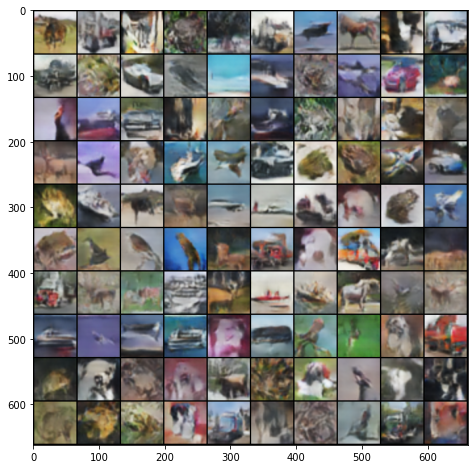

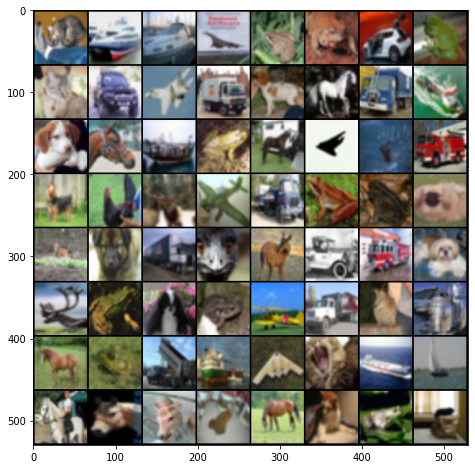

In [109]:
input_noise = torch.randn(100, latent_vector_size, device=device)
# labels = [i for i in range(10)] *10
# labels = torch.Tensor(labels).long().to(device)
labels = torch.randint(0,10,(100,),dtype = torch.long,device = device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise, labels).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(8,8))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/GAN2/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(8,8))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

My final architecture is ACGAN, I'll talk about something I have tried to make the model much better.

1. Flip some labels when training generator: real = fake, fake = real. It really worked, but have no idea why it works.
2. Using batchnorm.
3. Avoid sparse gradients: ReLU, MaxPool. So use leakyReLU and Conv2d + stride for downsampling,  ConvTranspose2d + stride for upsampling.
4. Use soft and noisy labels. If it is real, then replace the label with a random number between 0.7 and 1.2, and if it is a fake sample, replace it with a random number between 0.0 and 0.3.
5. Use the ADAM optimizer.
6. Use dropouts.
7. Use an Embedding layer in conditional GANs.

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

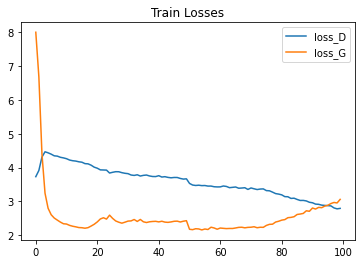

In [110]:
# ANSWER FOR PART 2.2 IN THIS CELL*
import matplotlib.pyplot as plt
plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='loss_D')
plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='loss_G')
plt.legend()
plt.title('Train Losses')
plt.show()

# file=open('/content/drive/MyDrive/icl_dl_cw2/GAN2/train_losses_D.txt','w')
# file.write(str(train_losses_D));
# file.close()

# file=open('/content/drive/MyDrive/icl_dl_cw2/GAN2/train_losses_G.txt','w')
# file.write(str(train_losses_G));
# file.close()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

The loss curves look sensible, at the beginning, loss_G dropped significantly and it is because the initial weights are easily optimized. After about 10 epochs, the loss of the two begins to fluctuate steadily, indicating that the two fight against each other. After 75 epochs,loss_G rises, indicating that the generation more difficult to generate images to deceive. When the generator learns to produce our images well, it's inevidable to make the job of the discriminator harder.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:** 

Based on the images created by your generator using the `fixed_noise` vector during training, provide a discussion on whether you noticed any mode collapse, what this behaviour may be attributed to, and explain what you did in order to cope with mode collapse.

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**

In fact, when ACGAN is not used, mode collapse is easy to happen, and the generated pictures are not diverse enough. After trying many methods, ACGAN was finally selected to get a better generator. 

Because generating similar or the same type of pictures, the generator can better fool the discriminator, but when ACGAN is used, because the label is added, it makes it better to generate different types of pictures.



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="blue"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# !cd /content/drive/MyDrive/icl_dl_cw2/

In [ ]:
!pip install -q torch torchvision

In [1]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [2]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

def gan_denorm(x):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    return x

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [11]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [9]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, device=device)
input_labels = [7] * 100
input_labels = torch.Tensor(input_labels).long().to(device)
# input_labels = torch.randint(0,10,(100,),dtype = torch.long, device = device) # use it to generate different types of pictures
gan_input = [input_noise, input_labels] # In case you want to provide a tuple, we wrap ours

9920512it [00:20, 473306.83it/s] Used Convs
Used Convs
Used Convs



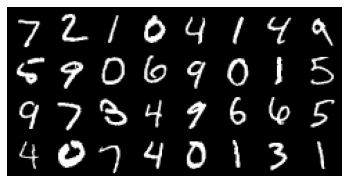

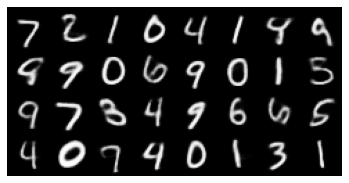

In [5]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = torch.jit.load('./VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 6433512 which is ok


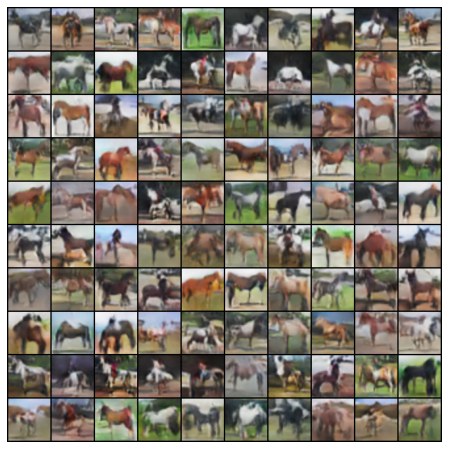

In [10]:
# GAN Tests
model_G = torch.jit.load('./GAN_G_model.pth')
model_D = torch.jit.load('./GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(8,8))
plt.axis('off')
show(generated)